#**Reto : Generación de un modelo inteligente de clasificación con redes neuronales profundas para la detección de amenazas aéreas**
---
##Presentado a: Prof. Víctor Adrián Sosa Hernández
##Presentado por: Sebastián Torres Franco

#4 Preprocesa la base de datos por poder trabajar con ella.

## Conclusíón del punto

Se realiza un preprocesamiento de la base de datos que consiste en los siguientes puntos:

* **Total de archivos**: Se tiene un total de 8481 archivos de imagen.

* **Identificación de los tipos de imagen en los directorios**: Se encuentran diferentes tipos de imagenes en todos los directorios, pero el predominantes es jpg.

* **Conteo de imagen por directorio y tipo de imagen**: Se tienen 1424 imagenes de aviones, 1186 de cohetes, 1332 de drones, 1338 de helicópteros, 1867 de jet, y 1334 de misiles.

* **Verificación de 25 imagenes**: Se realizo el conteo de 2 imágenes por directorio, encontrando que existen errores en la clasificación de la base de datos. Algunos aviones se etiquetan como cohetes, y algunos drones como helicópteros. Se omite el proceso de corrección de etiquetas, pero se recomendaría fuertemente su revisión.

* Se realiza una limpieza de archivos, eliminando aquellos formatos con extensiones inusuales para los procesos de tensorflow. Con este proceso se pasa de 8481 imágenes a 8390.

* Se genera una base de datos, concatenando las imágenes y etiquetas para su posterior separación en grupos de entrenamiento y prueba


In [ ]:
#******************************** Conexión a google drive
from google.colab import drive
drive.mount("/content/gdrive")


Mounted at /content/gdrive


In [ ]:
#******************************** Instalación de bibliotecas
#************ Librerías de procesamiento
import pandas as pd
import numpy as np
import tensorflow as tf
import collections
import random
from collections import Counter
import sklearn
from sklearn.model_selection import train_test_split

#*********** Librerías para trabajo con directorios
import pathlib
import os

#*********** Librerías Visualización de imágenes y progreso
import PIL
import matplotlib.pyplot as plt
from tqdm import tqdm

#*********** Librerías para guardar avances
import pickle

Cantidad de archivos el dataset:  8481
Cantidad de archivos en el directorio avion: 1424
Cantidad de archivos en el directorio cohete: 1186
Cantidad de archivos en el directorio dron: 1332
Cantidad de archivos en el directorio helicoptero: 1338
Cantidad de archivos en el directorio jet: 1867
Cantidad de archivos en el directorio misil: 1334

 ****************** Listado extensiones directorio avion******************
Counter({'.jpg': 1278, '.png': 86, '.jpeg': 35, '.JPG': 13, '.webp': 8, '.bin': 1, '.gif': 1, '.aspx': 1, '.2': 1})
 Alturas de las imagenes en el directorio: 
  {2048, 2093, 4160, 2126, 90, 2158, 2160, 2183, 2187, 148, 150, 153, 156, 157, 160, 165, 167, 173, 175, 180, 183, 188, 190, 2240, 193, 194, 196, 200, 204, 205, 207, 210, 211, 212, 214, 217, 220, 225, 227, 228, 230, 231, 232, 236, 239, 240, 241, 242, 245, 246, 250, 252, 2304, 258, 259, 260, 261, 262, 264, 267, 270, 271, 272, 273, 280, 281, 282, 284, 285, 287, 288, 289, 290, 2340, 292, 294, 298, 299, 300, 2349, 301, 30

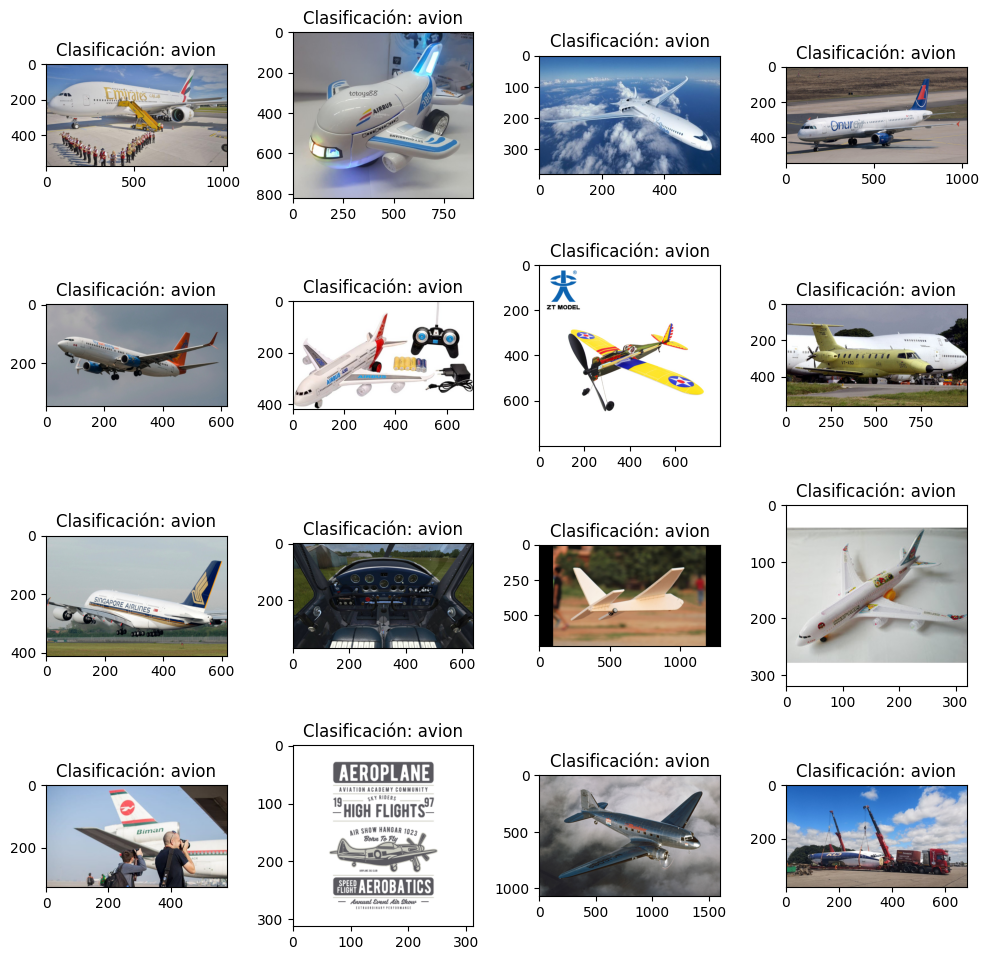

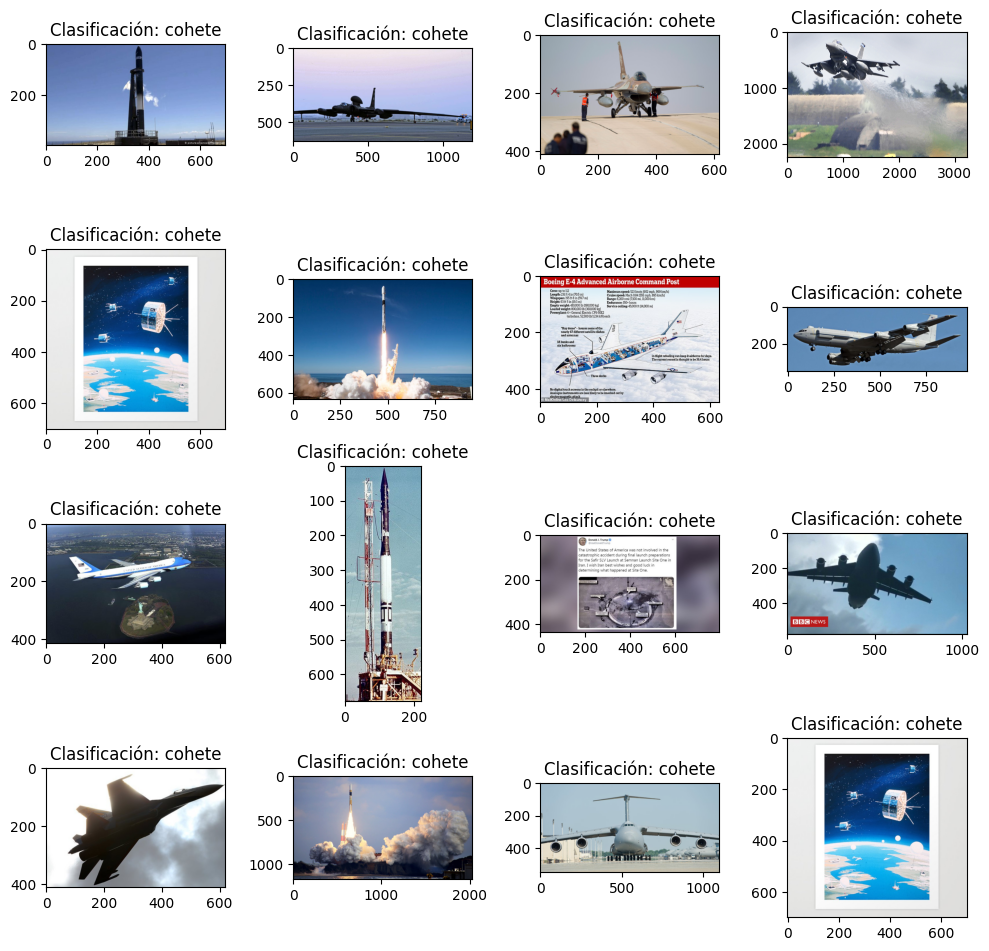

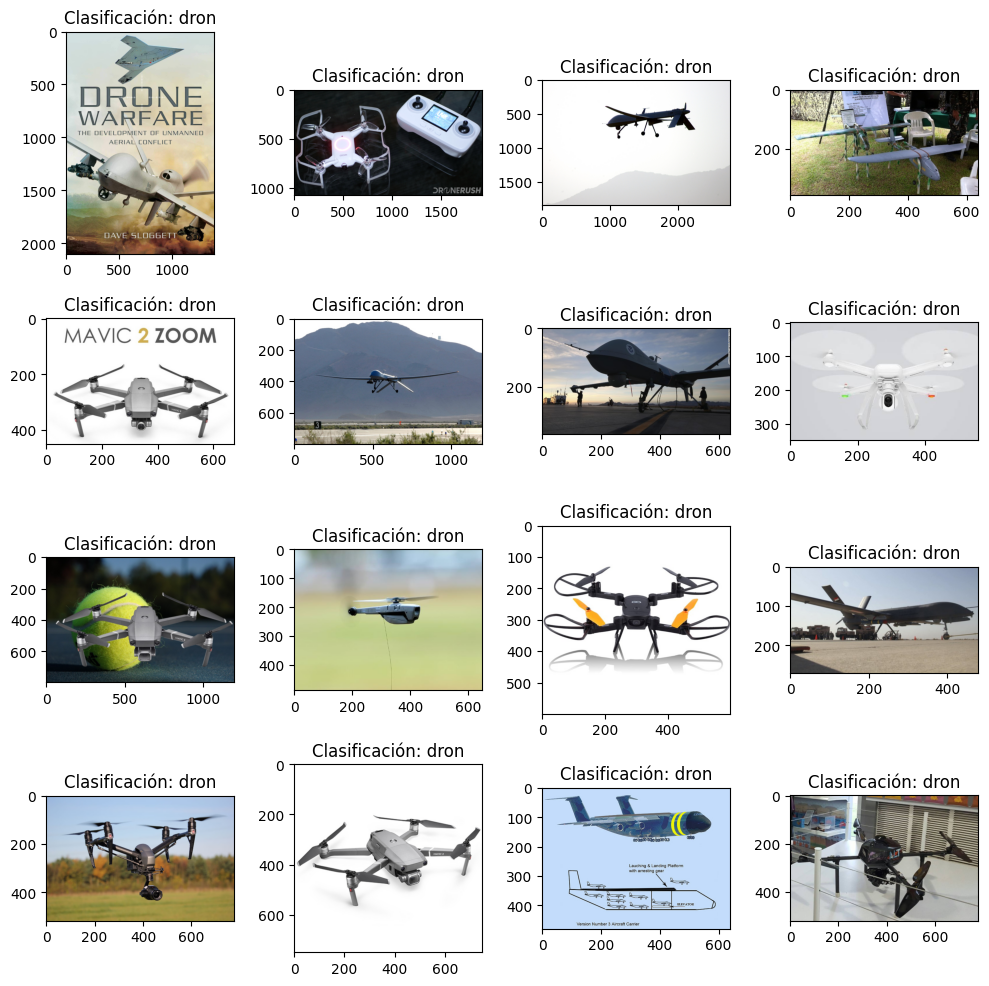

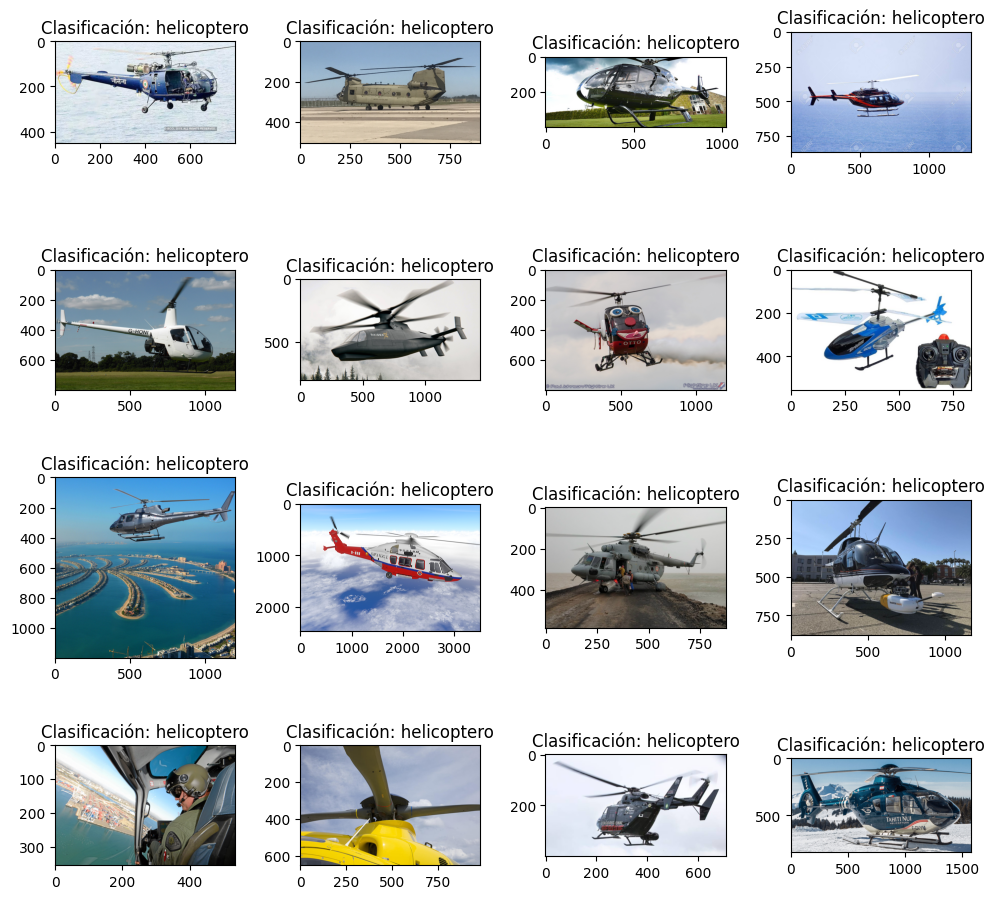

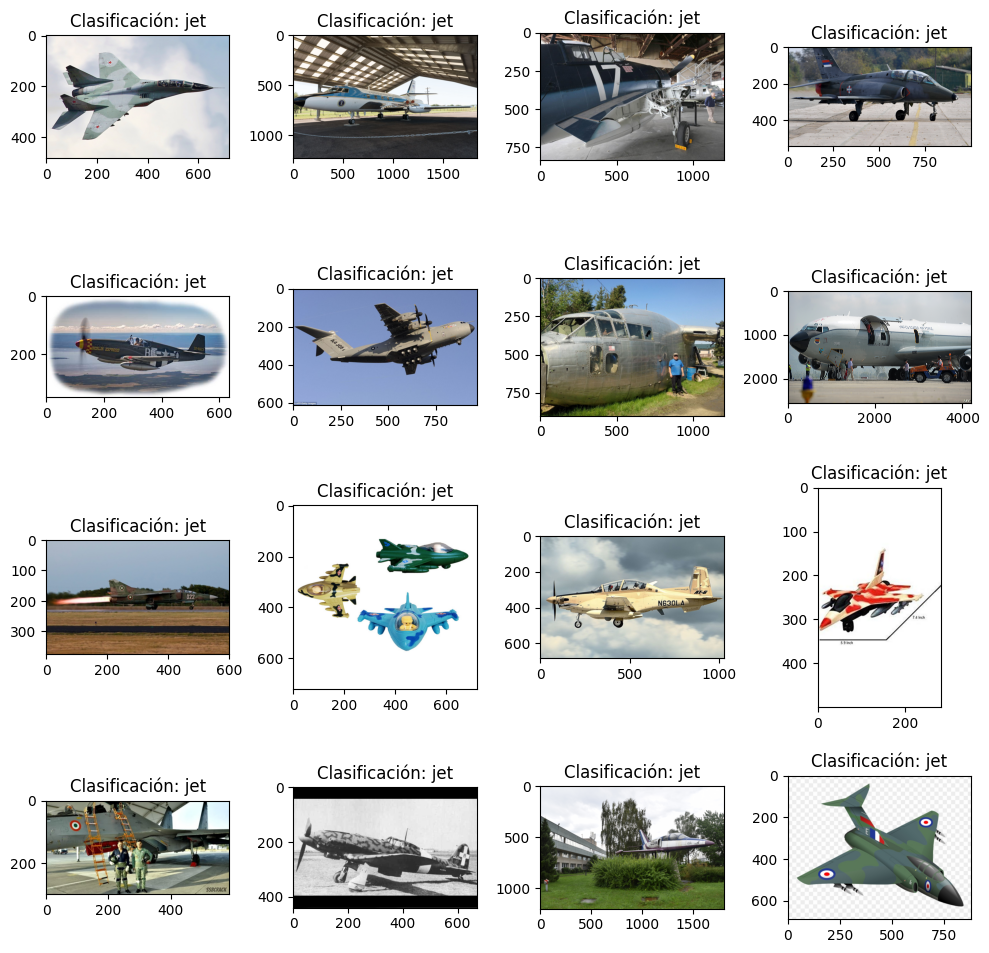

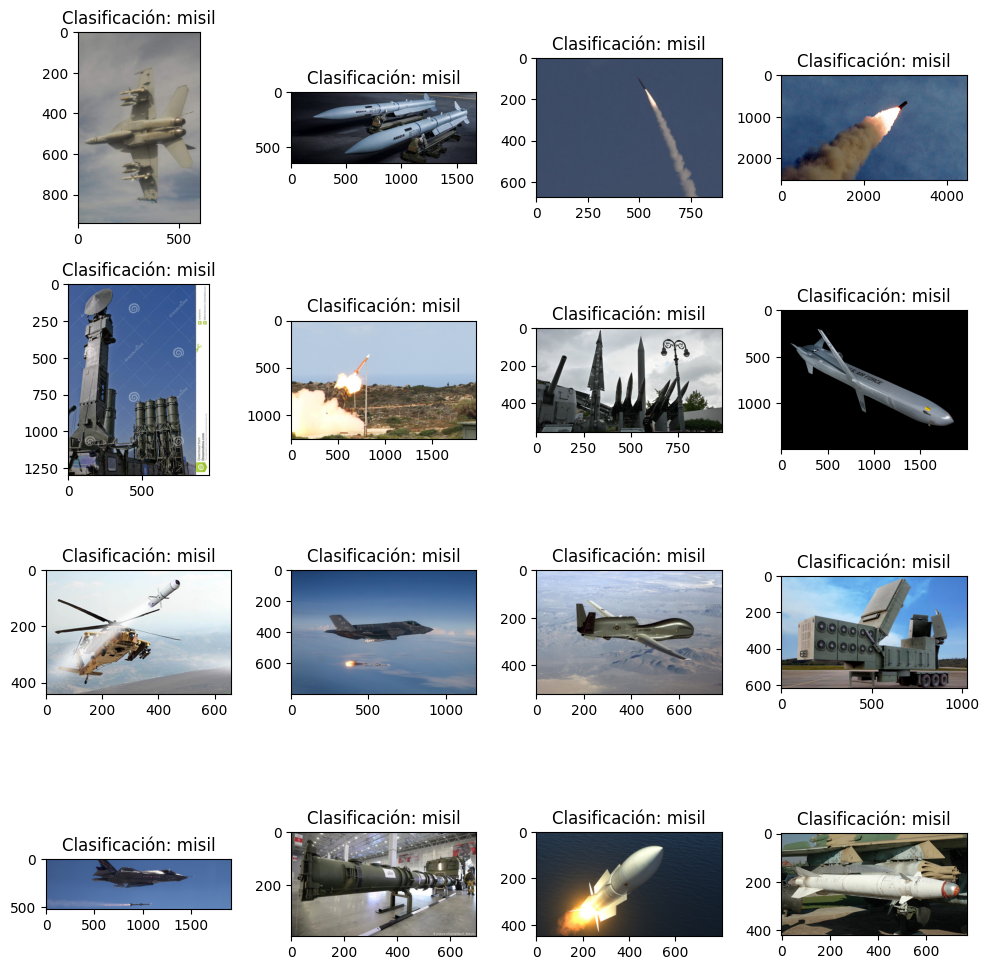

In [ ]:
#******************************* Definición de funciones
def get_extension(path,dir_id):
    '''
    Descripción
        Función encargada de formar una lista con las extensiones de los archivos contenidos en un directorio con ruta "path"
        Imprime también el tamaño de las imágenes en el directorio
    Inputs:
        * path: Ruta del directorio a inspeccionar
        * dir_id: string usado para impresión de resultado. Contiene el ID de la ruta ()
    Returns:
        * None
    '''
    #****************************** 1) Impresión de extensiones
    ext_list=[] #Se crea la lista para concatenar las extensiones de los archivos

    for archivo in os.listdir(path): #Se recorre el directorio tomando y almacenando la extensión de cada archivo
        name_file,ext_file=os.path.splitext(archivo)
        ext_list.append(ext_file)

    #Se crea un directorio de la forma {extensión:conteo}
    counter_ext=Counter(ext_list)
    print(f"\n ****************** Listado extensiones directorio {dir_id}******************")
    print(counter_ext)

    #****************************** 2) Impresión de tamaño de imagenes
    heights=[] #Lista para concatenar altos
    widths=[] #Lista para concatenar anchos
    for archivo in os.listdir(path): #Se recorren los archivos del directorio
        ruta_archivo=os.path.join(path,archivo)  #Se toma la ruta del archivo
        imagen=tf.keras.preprocessing.image.load_img(ruta_archivo) #Se carga la imagen
        im_arr=tf.keras.preprocessing.image.img_to_array(imagen) #Se convierte imagen en array
        size_im=im_arr.shape #Se toma la dimensión de la imagen
        heights.append(size_im[0]) #Se almacena el alto de la imagen
        widths.append(size_im[1]) #Se lamacena el ancho de la imagen

    #Impresión de las dimensiones de las imagenes en el directorio
    print(" Alturas de las imagenes en el directorio: \n ",set(heights))
    print("\n Alturas de las imagenes en el directorio: \n ",set(widths))


def sample_dir_check(path,check_id):
    '''
    Descripción:
        Función encargada de realizar un chequeo sobre 4 imagenes de un directorio
    Inputs:
        * path: directorio con los archivos a chequear
        * cheack_id: Label con el cual serán comparados los archivos
    Returns:
        None
    '''
    path_obj=pathlib.Path(path) #Se convierte el archivo a objeto de pathlib
    list_of_files=list(path_obj.glob("*")) #Se toma la lista de archivos en el directorio

    #Se genera la figura de verificación
    fig,axs=plt.subplots(4,4,figsize=(10,10))
    for j in range(4):
        for i in range(4):
            random_path=random.choice(list_of_files) #Se toma un archivo aleatorio del directorio
            random_im=tf.keras.preprocessing.image.load_img(random_path,color_mode="rgb")
            arr_im=tf.keras.preprocessing.image.img_to_array(random_im)
            axs[i,j].imshow(arr_im.astype("uint8")) #Se genera la gráfica del archivo seleccionado
            axs[i,j].set_title(f"Clasificación: {check_id}") #Se imprime título para chequeo label vs imagen
            plt.tight_layout()

#************************************************************************************************************************

#******************************* 1) Conteo total de imagenes en la base de datos
#*************** Toma directorios base y de cada una de las clases
DirBase="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos"
DirBase=pathlib.Path(DirBase)

DirC1="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/avion"
DirC2="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/cohete"
DirC3="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/dron"
DirC4="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/helicoptero"
DirC5="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/jet"
DirC6="/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/objetos/misil"

#*************** Conteo de archivos total y por directorio
#******* Cantidad total de archivos
print("Cantidad de archivos el dataset: ",len(list(DirBase.glob("*/*")))) #Impresión de total de archivos

#******* Cantidad por directorio
#Lista con los id de los directorios a imprimir
lista_ids=["avion","cohete","dron","helicoptero","jet","misil"]

for id in lista_ids: #Impresión de total de archivos por directorio
    print(f"Cantidad de archivos en el directorio {id}:",len(list(DirBase.glob(f"*{id}/*"))))

#******************************* 2) Revisión de los tipos de archivo por directorio
list_dirs=[DirC1,DirC2,DirC3,DirC4,DirC5,DirC6] #Se almacenan los diccionarios en una lista
for path, id in zip(list_dirs,lista_ids):
    get_extension(path,id) #Se ejecuta función para verificar el tipo de archivo por directorio

#******************************* 3) Revisión de algunas muestras de cada directorio
print("\n ************************** Verificación muestras *************************** \n")
for path, id in zip(list_dirs,lista_ids):
    sample_dir_check(path,id) #Se ejecuta función para verificar algunas muestras de los archivos en el directorio (Check imagen vs etiqueta)




## 4.1 Limpieza de datos

Teniendo en cuenta que tensorflow puede generar errores como el mostrado a continaucíón ante imágenes de formatos desconocidos a la hora de entrenar el modelo, se mantienen únicamente aquellas con los formatos propuestos en el log del error, y se eliminan las demás

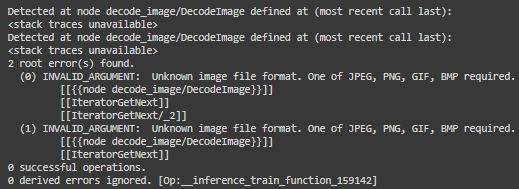

In [ ]:
#*************** elección de extensiónes y selección de archivos
#******* Se genera la lista de extensiones a mantener
extensions_to_retain = [".jpg",".jpeg", ".png", ".gif",".bmp"]  # Extensiones de archivo que pueden tener problemas durante el fit del modelo

#******* Se itera sobre cada directorio eliminando las extensiones de la lista
for path in list_dirs:
    for filename in os.listdir(path):
        if not any(filename.lower().endswith(ext) for ext in extensions_to_retain):
            file_path = os.path.join(path, filename)
            os.remove(file_path)

#*************** Revisión de resultados post cleaning en cad directorio
print("Cantidad de archivos el dataset: ",len(list(DirBase.glob("*/*")))) #Impresión de total de archivos

for id in lista_ids: #Impresión de total de archivos por directorio
    print(f"Cantidad de archivos en el directorio {id}:",len(list(DirBase.glob(f"*{id}/*"))))

for path, id in zip(list_dirs,lista_ids):
    get_extension(path,id) #Se ejecuta función para verificar el tipo de archivo por directorio

Cantidad de archivos el dataset:  8390
Cantidad de archivos en el directorio avion: 1413
Cantidad de archivos en el directorio cohete: 1175
Cantidad de archivos en el directorio dron: 1319
Cantidad de archivos en el directorio helicoptero: 1317
Cantidad de archivos en el directorio jet: 1848
Cantidad de archivos en el directorio misil: 1318

 ****************** Listado extensiones directorio avion******************
Counter({'.jpg': 1278, '.png': 86, '.jpeg': 35, '.JPG': 13, '.gif': 1})
 Alturas de las imagenes en el directorio: 
  {2048, 2093, 4160, 2126, 90, 2158, 2160, 2183, 2187, 148, 150, 153, 156, 157, 160, 165, 167, 173, 175, 180, 183, 188, 190, 2240, 193, 194, 196, 200, 204, 205, 207, 210, 211, 212, 214, 217, 220, 225, 227, 228, 230, 231, 232, 236, 239, 240, 241, 242, 245, 246, 250, 252, 2304, 258, 259, 260, 261, 262, 264, 267, 270, 271, 272, 273, 280, 281, 282, 284, 285, 287, 288, 289, 290, 2340, 292, 294, 298, 299, 300, 2349, 301, 303, 306, 307, 309, 312, 313, 315, 317, 319, 3

## 4.2 Creación de bases de datos

In [ ]:

#****************************** Inicialización de variables
Imagenes=[]  # Lista para almacenar imágenes de la base de datos
Etiquetas=[] # Lista para almacenar etiquetas de la base de datos

#****************************** Definición de funciones

def imagen_valida(archivo,extensiones=[".jpg", ".png",".jpeg", ".gif"]):
    '''
    Descripción:
       Función encargada de dos puntos. 1) Verificar que el nombre del archivo exista en el directorio con la extensión especificada en el input
       2) tomar la extensión del archivo

    Inputs:
    * archivo: Ruta del archivo
    * extensiones: lista de extensiones permitidas para archivo

    Returns:
    * es_archivo * es_imagen : Bool si el archivo (nombre sin extensión) está en la ruta y si cprresponde a las extensiones del input
    '''

    nom_archivo,ext_archivo=os.path.splitext(archivo) #Se divide el nombre del archivo en nombre ,extensión
    es_archivo=os.path.isfile(archivo) #Se verifica la existencia del archivo en el directorio
    es_imagen= ext_archivo.lower() in extensiones #Se verifica que la extensión del archivo esté en la lista de extensiones permitidas

    return es_archivo and es_imagen

def construir_base_datos(etiqueta, DIR):
  '''
  Descripción
    Función encargada de generar un arreglo de imágenes, asociadas a una etiqueta

  Inputs
    * etiqueta: etiqueta del directorio (Boya,carguero....)
    * DIR: Directorio donde se encuentran alojadas las imágenes

  Returns
    * Update: Actualización de listas Imágenes y Etiquetas
  '''
  for archivo in tqdm(os.listdir(DIR)): # Toma todos los archivos dentro de un directorio
    ruta = os.path.join(DIR,archivo)    # Tomamos el directorio base y concatenamos el "nombre del archivo"
    if imagen_valida(ruta):             # Llamamos la función que definimos para determinar si el archivo estaba en efecto en la ruta
      img = tf.keras.preprocessing.image.load_img(ruta,color_mode='rgb') #Cargamos la imagen como rgb
      matriz_img = tf.keras.preprocessing.image.img_to_array(img)        #Creamos un arreglo a partir de la imagen
      matriz_img = tf.image.resize(matriz_img/255,[224,224]) # Dos pasos 1) Normalizamos la imagen, 2do le hacemos un resize para dejar del tamaño de la imagen 150x150
      Imagenes.append(matriz_img.numpy())                    # Se toma la matriz de la imagen y se agerga al arreglo
      Etiquetas.append(etiqueta)                             # Se almacena también la etiqueta.

#**********************************************************************************************************************************************************************

# Se generan las bases de datos para cada uno de los conjuntos
construir_base_datos(0,DirC1)   #aviones
print('\n',len(Etiquetas))
construir_base_datos(1,DirC2)   #cohetes
print('\n',len(Etiquetas))
construir_base_datos(2,DirC3)   #drones
print('\n',len(Etiquetas))
construir_base_datos(3,DirC4)   #helicópteros
print('\n',len(Etiquetas))
construir_base_datos(4,DirC5)   #jets
print('\n',len(Etiquetas))
construir_base_datos(5,DirC6)   #misiles
print('\n',len(Etiquetas))


100%|██████████| 1413/1413 [01:05<00:00, 21.41it/s]



 1413


100%|██████████| 1175/1175 [01:00<00:00, 19.33it/s]



 2588


100%|██████████| 1319/1319 [01:08<00:00, 19.24it/s]



 3907


100%|██████████| 1317/1317 [01:04<00:00, 20.39it/s]



 5224


100%|██████████| 1848/1848 [01:32<00:00, 20.00it/s]



 7072


100%|██████████| 1318/1318 [00:55<00:00, 23.71it/s]


 8390


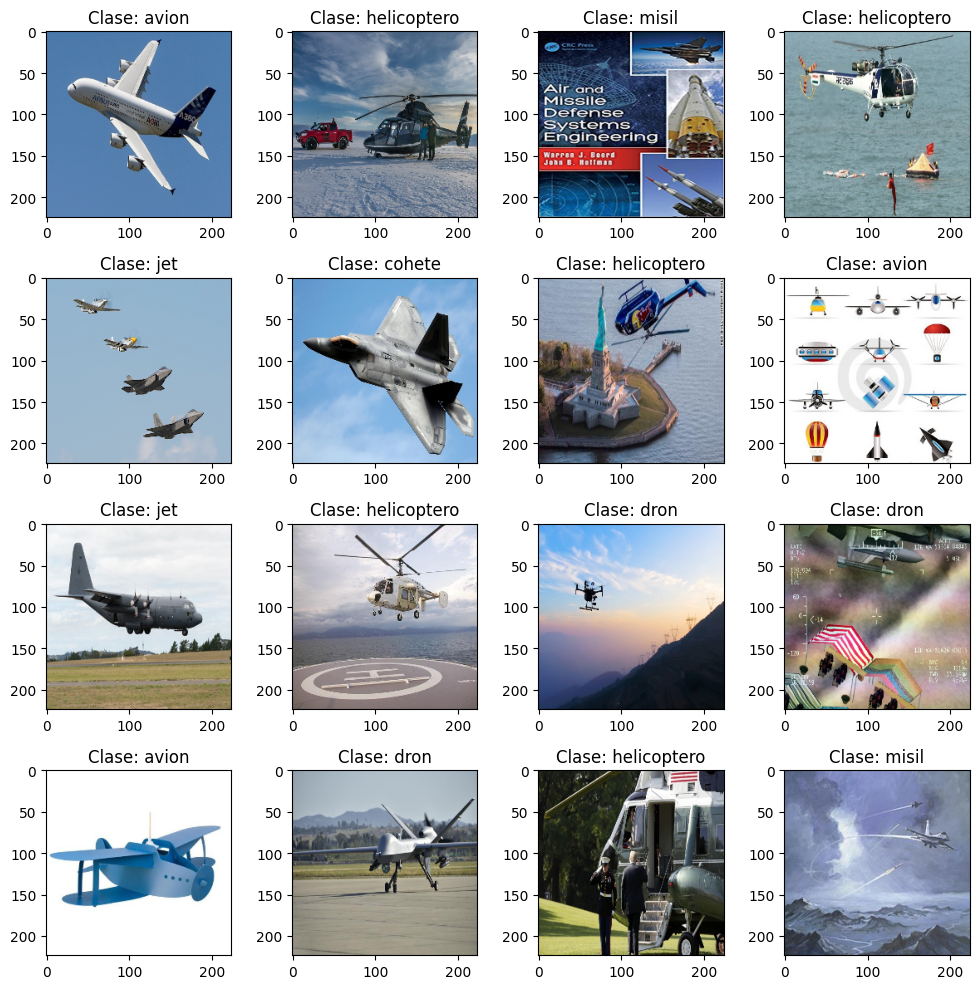

In [ ]:
#*****************************Se grafica una muestra de la base de datos para verificar resultados
fig,ax = plt.subplots(4, 4)
fig.set_size_inches(10, 10)
for i in range(4):
    for j in range (4):
        l = random.randint(0, len(Etiquetas))
        ax[i, j].imshow(Imagenes[l])
        ax[i, j].set_title('Clase: ' + lista_ids[Etiquetas[l]])
plt.tight_layout() #se ajustan al tamaño de la ventana de salida con: plt.tight_layout().


# 5 Genera los conjuntos de entrenamiento y prueba y haz un proceso de aumento de datos.

#Conclusión del punto

* Se generan los datos de entrenamiento y prueba mediante keras usando un 80% de los datos para entrenamiento, y un 20% de los datos para prueba
* Se realiza un proceso de data augmentation considerando las siguientes transformaciones:
  * Rotation Range
  * Zoom range
  * Width shift
  * Height shift
  * Hotizontal flip
  * Vertical flip

In [ ]:
#******************************* 1) División sets de entrenamiento y prueba

#Se realiza la partición del conjunto
img_entrenamiento,img_prueba,etq_entrenamiento,etq_prueba=train_test_split(Imagenes,Etiquetas,test_size=0.2,random_state=42)

#Las listas resultantes de la partición se convierten a arreglos
img_entrenamiento=np.array(img_entrenamiento)
img_prueba=np.array(img_prueba)
etq_entrenamiento=np.array(etq_entrenamiento)
etq_prueba=np.array(etq_prueba)


In [ ]:
#******************************** Se guardan los conjuntos para tener que evitar volver a generar la base de datos en caso de desconexión del servidor
np.save('/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/img_entrenamiento.npy', img_entrenamiento)
np.save('/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/img_prueba.npy', img_prueba)
np.save('/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/etq_entrenamiento.npy', etq_entrenamiento)
np.save('/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/etq_prueba.npy', etq_prueba)

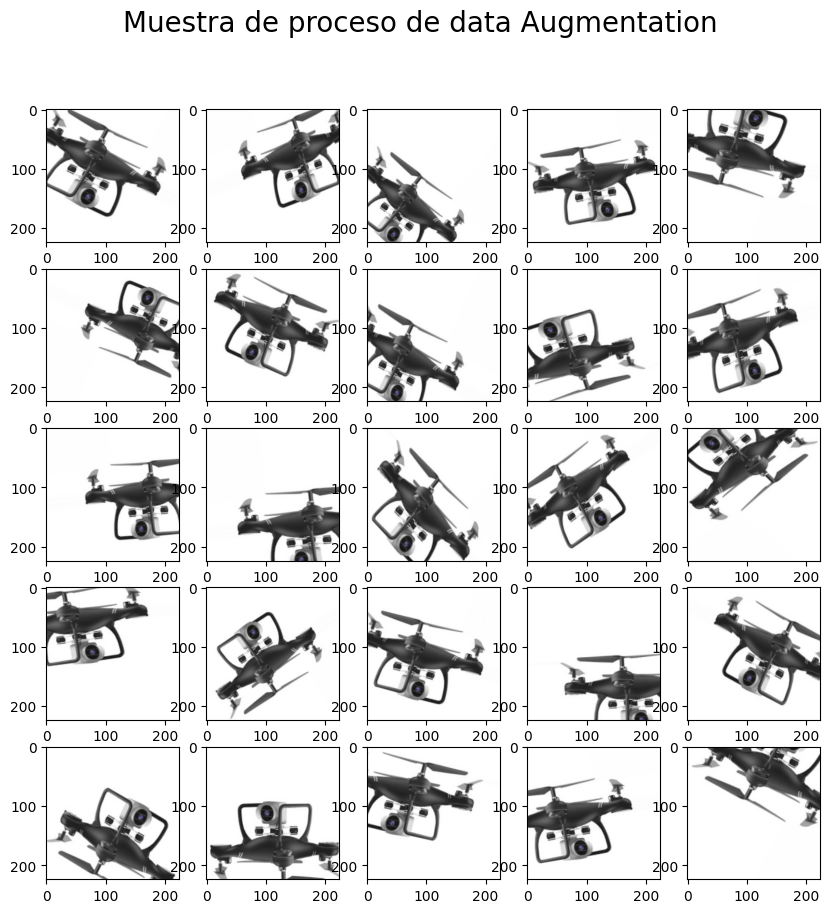

In [ ]:
#******************************* 2) Proceso de data augmentation

#******* Se genera el objeto de data augmentation
data_augment=tf.keras.preprocessing.image.ImageDataGenerator(
    width_shift_range=0.3,
    height_shift_range=0.3,
    vertical_flip=True,
    horizontal_flip=True,
    zoom_range=0.1,
    rotation_range=45,
)

#******* Selección de batch para mostrar resultados del data augmentation
sample_img=img_entrenamiento[2]
sample_data=np.expand_dims(sample_img,0)
iterator = data_augment.flow(sample_data,batch_size = 1)

#******* Imagenes mostrando resultado del data augmentation
figure,axs=plt.subplots(5,5,figsize=(10,10))
plt.suptitle("Muestra de proceso de data Augmentation",fontsize=20)
for i in range(5):
    for j in range(5):
        gen_batch=iterator.next()
        aug_image=gen_batch[0]
        axs[i,j].imshow(aug_image)

#6 Genera tres modelos:


##6.a Modelo con arquitectura desde 0

El primer modelo debes diseñarlo desde cero creando la arquitectura y configurando los hiperparámetros utilizando aumento de datos.

## Conclusión del punto:

Se propone un modelo con las siguientes capas:

* Capa de normalización
* Capa de convolución compuesto por 4 pares de convolución y MaxPooling
* Capa de flattening
* Capa densa
* Capa de clasificación
* Total de parámetros: 13102598  Total de parámetros entrenables: 13102598
* El modelo se entrena considerando data augmentation

El log de entrenamiento muestra que el modelo llega a un accuracy de 38% sobre conjunto de prueba.

Adicional, se genera un modelo sin la opción de data augmentation, donde se evidencia un sobre entrenamiento al no usar esta opción. En este caso el accuracy sobre el set de entrenamiento llega a un 92%, mientras que sobre el conjunto de validación se queda en un 36%

In [ ]:
#******************************* Se configuran semillas para reproducibilidad del ejercicio
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
#*******************************************************************Modelo con arquitectura propia y data augmentation
#******************************* Inicialización de variables
height=224
width=224
batch=400
numberofclasses=6

#******************************* Capa de normalización
normal_layer=tf.keras.layers.experimental.preprocessing.Rescaling(1./255,input_shape=(height,width,3))

#******************************* Capa de convolución para extracción de parámetros locales
conv_layer=tf.keras.Sequential([
       tf.keras.layers.Conv2D(32,(5,5),activation="relu",padding="Same",input_shape=(height,width,3)), #Agregamos el layer como convolución
       tf.keras.layers.MaxPooling2D((2,2)), #Recordemos que esto reduce el tamaño de la imagen a la mitad
       tf.keras.layers.Conv2D(64,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)), #Es interesante notar que las capas de MaxPooling no tiene parámetros entrenables
       tf.keras.layers.Conv2D(96,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)),
       tf.keras.layers.Conv2D(128,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)), #Acá termina nuestra red convolucional. Ahora la conectaremos con nuestra red profunda
       tf.keras.layers.Flatten(),
])

#******************************* Capa densa
dense_layer=tf.keras.Sequential([
       tf.keras.layers.Dense(512,activation="relu"),
       tf.keras.layers.Dense(128,activation="relu"),
       tf.keras.layers.Dense(32,activation="relu"),])

#******************************* Capa de flattening
flatt_layer=tf.keras.layers.Flatten()

#******************************* Capa de salida
class_layer=tf.keras.layers.Dense(numberofclasses,activation="softmax")

#******************************* Ensamble de capas
model_1=tf.keras.Sequential([
    normal_layer,
    conv_layer,
    flatt_layer,
    dense_layer,
    class_layer
])

#******************************* Resumen del modelo
model_1.summary()

#******************************* compile y fit del modelo
model_1.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics=["accuracy"])
trained_model_1=model_1.fit(data_augment.flow(img_entrenamiento,etq_entrenamiento,batch_size=batch),epochs=150,batch_size=batch,validation_data=(img_prueba,etq_prueba))



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 sequential (Sequential)     (None, 25088)             187040    
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 sequential_1 (Sequential)   (None, 32)                12915360  
                                                                 
 dense_3 (Dense)             (None, 6)                 198       
                                                                 
Total params: 13102598 (49.98 MB)
Trainable params: 13102598 (49.98 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/150


In [ ]:
#**************** Se guarda el log de entrenamiento del modelo
pickle.dump(trained_model_1, open("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/trained_model_1.pkl", "wb"))

In [ ]:
#*******************************************************************Modelo con arquitectura propia SIN data augmentation
#******************************* Capa de normalización
normal_layer=tf.keras.layers.experimental.preprocessing.Rescaling(1./255,input_shape=(height,width,3))

#******************************* Capa de convolución para extracción de parámetros locales
conv_layer=tf.keras.Sequential([
       tf.keras.layers.Conv2D(32,(5,5),activation="relu",padding="Same",input_shape=(height,width,3)), #Agregamos el layer como convolución
       tf.keras.layers.MaxPooling2D((2,2)), #Recordemos que esto reduce el tamaño de la imagen a la mitad
       tf.keras.layers.Conv2D(64,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)), #Es interesante notar que las capas de MaxPooling no tiene parámetros entrenables
       tf.keras.layers.Conv2D(96,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)),
       tf.keras.layers.Conv2D(128,(3,3),activation="relu",padding="Same"),
       tf.keras.layers.MaxPooling2D((2,2)), #Acá termina nuestra red convolucional. Ahora la conectaremos con nuestra red profunda
       tf.keras.layers.Flatten(),
])

#******************************* Capa de flattening
flatt_layer=tf.keras.layers.Flatten()

#******************************* Capa densa
dense_layer=tf.keras.Sequential([
    tf.keras.layers.Dense(512, activation="relu"),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),])

#******************************* Capa de salida
class_layer=tf.keras.layers.Dense(numberofclasses,activation="softmax")

#******************************* Ensamble de capas
model_12=tf.keras.Sequential([
    normal_layer,
    conv_layer,
    flatt_layer,
    dense_layer,
    class_layer
])

#******************************* Resumen del modelo
model_12.summary()

#******************************* compile y fit del modelo
model_12.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics=["accuracy"])
trained_model_12=model_12.fit(img_entrenamiento,etq_entrenamiento,epochs=50,batch_size=batch,validation_data=(img_prueba,etq_prueba))

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 sequential_3 (Sequential)   (None, 25088)             187040    
                                                                 
 flatten_3 (Flatten)         (None, 25088)             0         
                                                                 
 sequential_4 (Sequential)   (None, 32)                12915360  
                                                                 
 dense_7 (Dense)             (None, 6)                 198       
                                                                 
Total params: 13102598 (49.98 MB)
Trainable params: 13102598 (49.98 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/50
1

In [ ]:
#**************** Se guarda el log de entrenamiento del modelo
pickle.dump(trained_model_12, open("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/trained_model_12.pkl", "wb"))

## 6b. Modelo pre entrenado
El segundo modelo debes construirlo utilizando un modelo pre-entrenado.

##Conclusión del punto

Se utiliza el modelo pre_entrenado MobileNetV2 para la capa convolucional, Se incorpora con una capa de normalización, una de avgpooling, y una de clasificación. De acuerdo con esto, el segundo modelo se compone de la siguiente manera:

* Capa de normalización
* Capa de convolución pre entrenada
* Capa de avg pooling
* Capa de clasificación
* Total de parámetros: 2983846. Total de parámetros entrenables: 725862
* El modelo generado considera data augmentation.

El Log de entrenamiento muestra que el modelo muestra resultados pobres, donde el accuracy del modelo se estanca tanto para set de prueba como para set de entrenamiento, en alrededor deñ 22%

Adicional, se genera un modelo sin la opción de data augmentation, donde también se evidencia estancamiento del accuracy.

In [ ]:
#******************************* Importación del modelo pre entrenado - Capa convolucional - CON DATA AUGMENTATION
model_pretrained=tf.keras.applications.MobileNetV2(
    input_shape=(224,224,3),     #Tamaño de las imagenes
    include_top=False,           #Se configura como falso para cargar únicamente la capa convolucional
    weights="imagenet",          #Definimos los pesos que usaremos por defeceto, asociados a la base de datos de imagenet
)
model_pretrained.trainable=False #Se desactiva el entrenamiento de parámetros para el modelo pre-entrenado


#******************************* Capa de normalización
normal_layer=tf.keras.layers.experimental.preprocessing.Rescaling(1./255,input_shape=(224,224,3)) #Capa de normalización.

#******************************* Capa de avg pooling para reducir el tamaño de la salida de la capa convolucional
pooling_layer=tf.keras.layers.GlobalAveragePooling2D()


#******************************* Capa densa
dense_layer=tf.keras.Sequential([
       tf.keras.layers.Dense(512,activation="relu"),
       tf.keras.layers.Dense(128,activation="relu"),
       tf.keras.layers.Dense(32,activation="relu"),])

#******************************* Capa de clasificación
class_layer=tf.keras.layers.Dense(numberofclasses,activation="softmax")

#******************************* Ensamble de capas
model_2 = tf.keras.Sequential([
normal_layer,
model_pretrained,
pooling_layer,
dense_layer,
class_layer
 ])

#******************************* Resumen del modelo
model_2.summary()

#******************************* compile y fit del modelo
learning_rate=0.0001 #Para evitar cambios bruscos en los pesos de la capa de clasificación
model_2.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),loss="sparse_categorical_crossentropy",metrics=["accuracy"])
trained_model_2=model_2.fit(data_augment.flow(img_entrenamiento,etq_entrenamiento,batch_size=batch),epochs=50,batch_size=batch,validation_data=(img_prueba,etq_prueba))


9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 sequential_6 (Sequential)   (None, 32)                725664    
                                                                 
 dense_11 (Dense)            (None, 6)                 198       
                                                         

In [ ]:
#**************** Se guarda el log de entrenamiento del modelo
pickle.dump(trained_model_2, open("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/trained_model_2.pkl", "wb"))

In [ ]:
#******************************* Importación del modelo pre entrenado - Capa convolucional - SIN DATA AUGMENTATION
model_pretrained=tf.keras.applications.MobileNetV2(
    input_shape=(224,224,3),     #Tamaño de las imagenes
    include_top=False,           #Se configura como falso para cargar únicamente la capa convolucional
    weights="imagenet",          #Definimos los pesos que usaremos por defeceto, asociados a la base de datos de imagenet
)
model_pretrained.trainable=False #Se desactiva el entrenamiento de parámetros para el modelo pre-entrenado


#******************************* Capa de normalización
normal_layer=tf.keras.layers.experimental.preprocessing.Rescaling(1./255,input_shape=(224,224,3)) #Capa de normalización. Nuestro input debe ser del mismo tamaño que el input del modelo preentrenado

#******************************* Capa de avg pooling para reducir el tamaño de la salida de la capa convolucional
pooling_layer=tf.keras.layers.GlobalAveragePooling2D()

#******************************* Capa densa
dense_layer=tf.keras.Sequential([
       tf.keras.layers.Dense(512,activation="relu"),
       tf.keras.layers.Dense(128,activation="relu"),
       tf.keras.layers.Dense(32,activation="relu"),])

#******************************* Capa de clasificación
class_layer=tf.keras.layers.Dense(numberofclasses,activation="softmax")

#******************************* Ensamble de capas
model_22 = tf.keras.Sequential([
normal_layer,
model_pretrained,
pooling_layer,
dense_layer,
class_layer
 ])

#******************************* Resumen del modelo
model_22.summary()

#******************************* compile y fit del modelo
learning_rate=0.0001 #Para evitar cambios bruscos en los pesos de la capa de clasificación
model_22.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),loss="sparse_categorical_crossentropy",metrics=["accuracy"])
trained_model_22=model_22.fit(img_entrenamiento,etq_entrenamiento,epochs=50,batch_size=batch,validation_data=(img_prueba,etq_prueba))


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 sequential_8 (Sequential)   (None, 32)                725664    
                                                                 
 dense_15 (Dense)            (None, 6)                 198       
                                                                 
Total params: 2983846 (11.38 MB)
Trainable params: 725

In [ ]:
#**************** Se guarda el log de entrenamiento del modelo
pickle.dump(trained_model_22, open("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/trained_model_22.pkl", "wb"))

## 6c. Modelo de Teachable Machine
El tercer modelo lo debes generar utilizando la herramienta Teachable Machine y exportándolo para poder cargarlo en tu cuaderno para compararlo.

## Conclusiones del punto
* Como primer paso se procede a exportar todo el registro de entrenamiento a Google Drive, para su posterior carga a Teachable machine.
* Se presentan las evidencias del entrenamiento en la aplicación y el código de salida para keras.

In [ ]:
#********************** Como primer paso para entrenar el modelo se guardan las imagenes del conjunto de entrenamiento en subfolders para luego ser subidos a Teachable machine

for i, image_matrix in tqdm(enumerate(img_entrenamiento)): #Se crea un objeto iterable para recorrer el set de entrenamiento
    class_id=lista_ids[etq_entrenamiento[i]]               #Se toma la clase de la imagen
    output_directory = f"/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/datos/Training_Teachable_Machine/{class_id}" #Se genera una variable con el nombre del directorio
    image = PIL.Image.fromarray((image_matrix*255).astype('uint8')) #Se deshace la normalización de la imagen
    image_path = os.path.join(output_directory, f'image_{i}.jpeg')  #Se asigna un serial a la imagen en la carpeta respectiva
    image.save(image_path) #Se guarda la imagen

6074it [00:35, 172.17it/s]


Se presentan las siguientes evidencias de entrenamiento en Teachable Machine
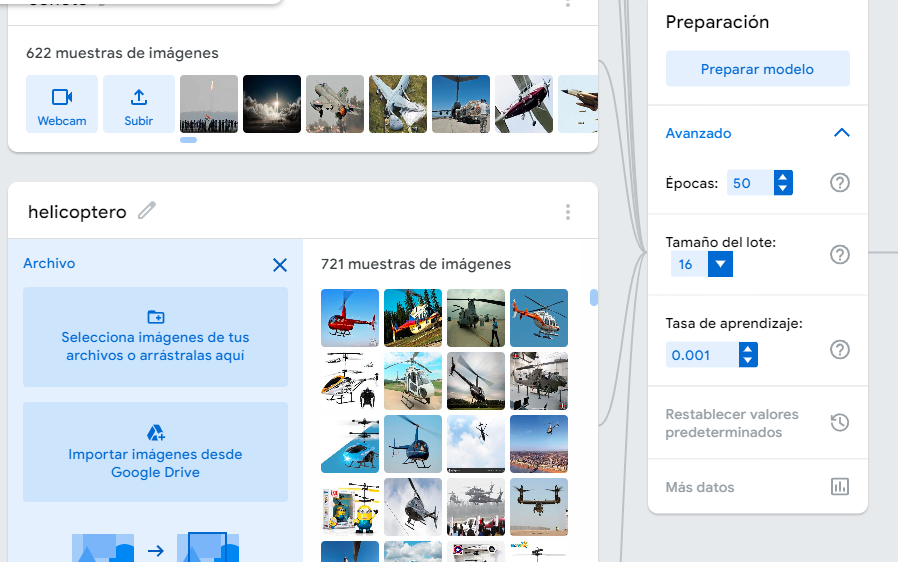

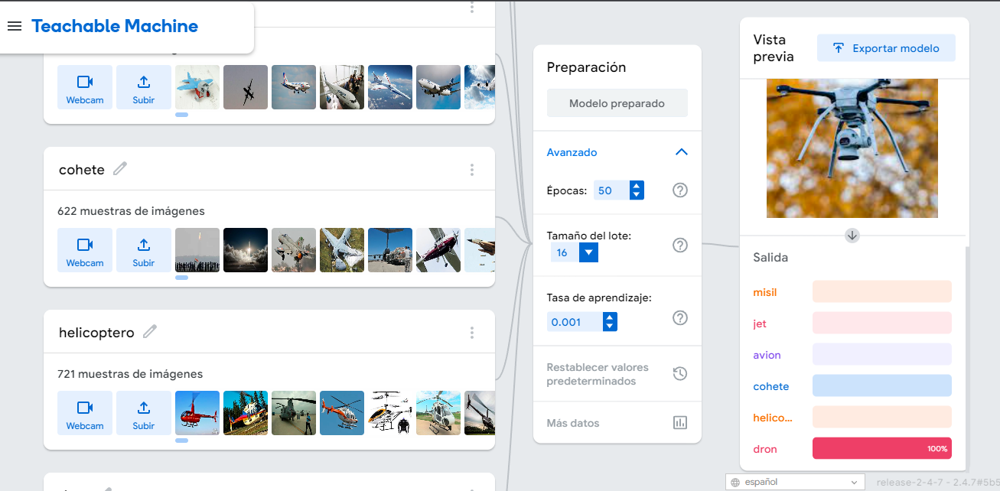


In [ ]:
#********************** Se presenta la evidencia del código generado en teachable machine

from keras.models import load_model  # TensorFlow is required for Keras to work
from PIL import Image, ImageOps  # Install pillow instead of PIL
import numpy as np

# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("keras_Model.h5", compile=False)

# Load the labels
class_names = open("labels.txt", "r").readlines()

# Create the array of the right shape to feed into the keras model
# The 'length' or number of images you can put into the array is
# determined by the first position in the shape tuple, in this case 1
data = np.ndarray(shape=(1, 224, 224, 3), dtype=np.float32)

# Replace this with the path to your image
image = Image.open("<IMAGE_PATH>").convert("RGB")

# resizing the image to be at least 224x224 and then cropping from the center
size = (224, 224)
image = ImageOps.fit(image, size, Image.Resampling.LANCZOS)

# turn the image into a numpy array
image_array = np.asarray(image)

# Normalize the image
normalized_image_array = (image_array.astype(np.float32) / 127.5) - 1

# Load the image into the array
data[0] = normalized_image_array

# Predicts the model
prediction = model.predict(data)
index = np.argmax(prediction)
class_name = class_names[index]
confidence_score = prediction[0][index]

# Print prediction and confidence score
print("Class:", class_name[2:], end="")
print("Confidence Score:", confidence_score)

# 7 Exporta los tres modelos creados

#Conclusión

Como se solicita, se presenta el código para exportar los tres modelos generados



In [ ]:
#************************** Se salva el modelo1 para posterior uso
model_1.save("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/model_1.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
#************************** Se salva el modelo2 para posterior uso
model_2.save("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/model_2.h5")

In [ ]:
#************************************* El modelo obtenido de teachable machine fue guardado directamente desde el aplicativo, y es cargado en las siguientes líneas
model_3 = tf.keras.models.load_model("/content/gdrive/MyDrive/Colab Notebooks/ArchivosCarga/TensorFlow/Reto/keras_model.h5", compile=False)

# 8 Comparación y elección de modelos

# Conclusiónes

* Se inspeccionan las métricas de modelos con arquitectura desde 0, y pre entrenados mediante gráficos. En ninguno se evidenció sobre entrenamiento.

* Se evalúa el modelo exportado por teachable machine sobre los conjuntos de entrenamiento y prueba.

* Los accuracy de los modelos se comparan sobre el conjunto de prueba, y se encuentra que el modelo propuesto con una Arquitectura desde 0 fue el que entrengó la mejor métrica (38%)



,acc_entrenamiento,acc_prueba,loss_entrenamiento,loss_prueba
0,0.381108,0.382002,1.500459,1.509904
1,0.923272,0.363528,0.126935,4.968997
2,0.216776,0.227056,1.779670,1.775405
3,0.235399,0.227056,1.757785,1.745683


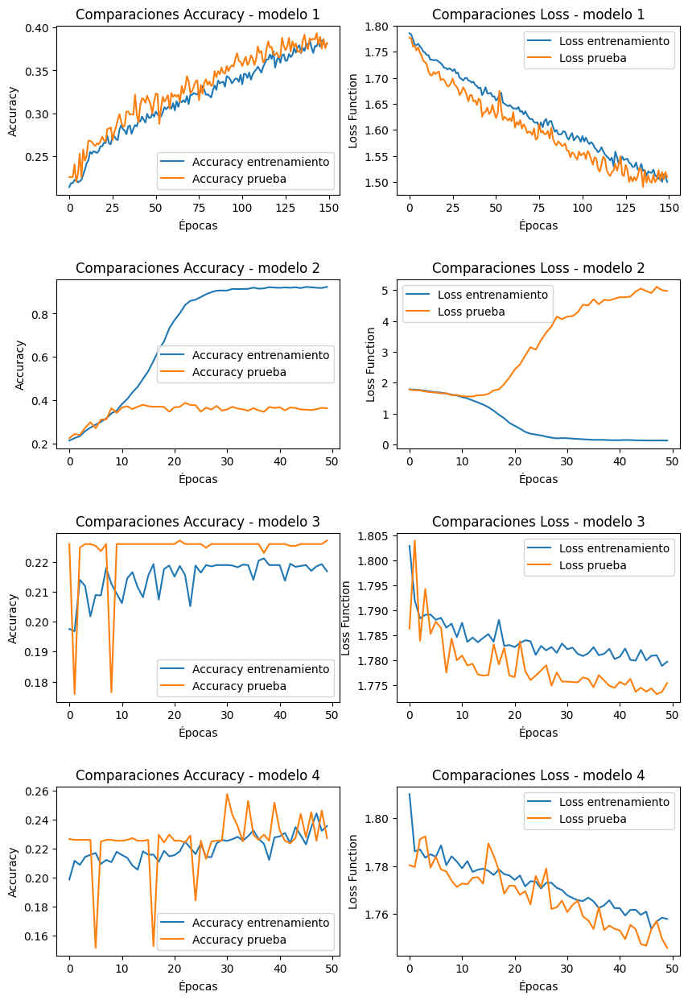

In [ ]:
#******************************* Definición de funciones

def model_compare(model_list):
    '''
    Descripción:
        Función encargada de generar un plot de comparación entre metricas loss y accuracy del modelo, junto con un dataframe comparativo.
    Inputs:
        * model_list: Lista con los modelos concatenados a ser evaluados
    Returns
        * compare_df: dataframe compartivo entre la métrica del modelo para set de prueba y validación
    '''
    #*********** Inicialización de variables
    dic_res={"acc_entrenamiento":[],"acc_prueba":[],"loss_entrenamiento":[],"loss_prueba":[]} #Se crea un diccionario para generar el dataframe comparativo
    n_models=len(model_list) #Se cuentan los modelos disponibles para el layout del modelo
    row_plot=0 #Contador usado para recorrer filas del subplot
    #*********** Proceso de gráfica + almacenamiento de métrica final
    figure,axs=plt.subplots(n_models,2,figsize=(10,15)) #Se genera el layout
    plt.subplots_adjust(hspace=0.5)
    for model in model_list: #Se realiza el proceso para cada modelo

        train_acc=model.history["accuracy"] #Se almacenan los valores de accuracy durante el entrenamiento y validación vs número de épocas
        val_acc=model.history["val_accuracy"]

        train_loss=model.history["loss"] #Se almacenan los valores de loss durante el entrenamiento y validación vs número de épocas
        val_loss=model.history["val_loss"]

        #Se realizan las gráficas comparativas entre entrenamiento y validación
        axs[row_plot,0].plot(train_acc,label="Accuracy entrenamiento")
        axs[row_plot,0].plot(val_acc,label="Accuracy prueba")
        axs[row_plot,0].legend()
        axs[row_plot,0].set_title(f"Comparaciones Accuracy - modelo {row_plot+1}")
        axs[row_plot,0].set_ylabel(f"Accuracy")
        axs[row_plot,0].set_xlabel("Épocas")

        axs[row_plot,1].plot(train_loss,label="Loss entrenamiento")
        axs[row_plot,1].plot(val_loss,label="Loss prueba")
        axs[row_plot,1].legend()
        axs[row_plot,1].set_title(f"Comparaciones Loss - modelo {row_plot+1}")
        axs[row_plot,1].set_ylabel(f"Loss Function")
        axs[row_plot,1].set_xlabel("Épocas")

        dic_res["acc_entrenamiento"].append(train_acc[-1])
        dic_res["acc_prueba"].append(val_acc[-1])
        dic_res["loss_entrenamiento"].append(train_loss[-1])
        dic_res["loss_prueba"].append(val_loss[-1])

        row_plot=row_plot+1

    #*********** Se genera el dataframe comparativo entre los modelos
    compare_df=pd.DataFrame(dic_res)

    return compare_df

#**********************************************************************************************************************

#Se generan las curvas de accuracy vs épocas para los modelos con arquitectura desde 0 y pre entrenados
#Se obtiene como resultado gráficas comparativas y dataframe comparativo compare_df
compare_df= model_compare([trained_model_1,trained_model_12,trained_model_2,trained_model_22])
compare_df


In [ ]:
#Se evalúan los valores de accuracy y loss function del modelo de teachable machine sobre el conjunto de prueba
#Los resultados se agregan al dataframe comparativo
model_3.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),loss="sparse_categorical_crossentropy",metrics=["accuracy"]) #Se compila el modelo para poder realizar las evaluaciones sobre los resultados.
val_loss,val_accuracy=model_3.evaluate(img_prueba,etq_prueba,batch_size=batch,verbose=1) #Valores sobre conjunto prueba

print(f"\n Accuracy prueba: {val_accuracy} , Loss Prueba: {val_loss}")

4/4 [==============================] - 4s 350ms/step - loss: 13.0891 - accuracy: 0.1007

 Accuracy prueba: 0.10072416067123413 , Loss Prueba: 13.089110374450684


## 8.a Inspeccionando al mejor modelo

Se inspeccionan algunos resultados acertados y equivocados del mejor modelo

53/53 [==============================] - 1s 19ms/step


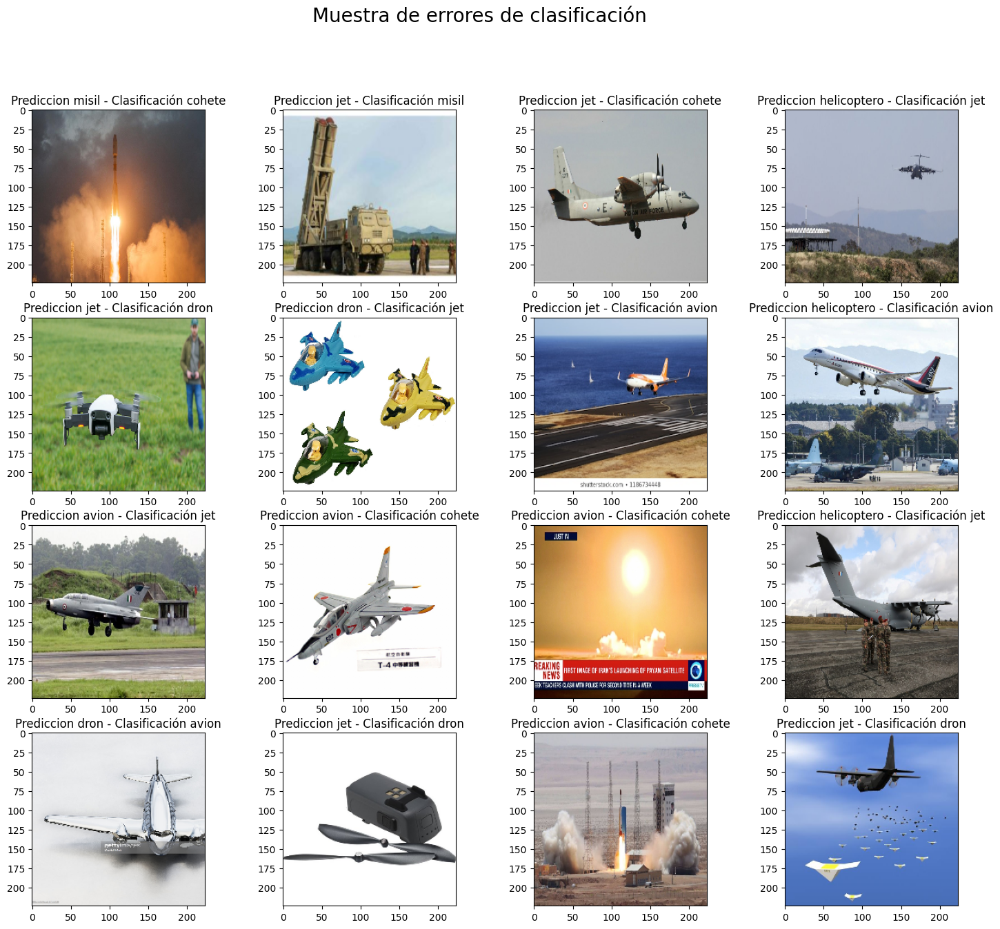

In [ ]:
#********************************* Se elabora una predicción sobre el set de prueba, y se toma el label de clasificación
predictions=model_1.predict(img_prueba)
label_predicted=np.argmax(predictions,axis=1)

#********************************* Se comparan los labels predecidos y verdaderos para tomar posiciones de aciertos y erores
compare=label_predicted==etq_prueba #Se genera un vector booleano comparando predicción vs realidad

#Se toman las posiciones con aciertos
rights=np.multiply(compare*1,range(compare.shape[0]))
rights=rights[rights>0]

#Se toman las posiciones con errores
wrongs=np.multiply((~compare)*1,range(compare.shape[0]))
wrongs=wrongs[wrongs>0]

#********************************* Gráfica de errores
fig,axs=plt.subplots(4,4,figsize=(18,15))

cont_im=0 #Contador para recorrer imagenes
for i in range(4):
    for j in range(4):
        idx_error=wrongs[cont_im]
        pred_class=lista_ids[label_predicted[idx_error]]
        real_class=lista_ids[etq_prueba[idx_error]]
        axs[i,j].imshow(img_prueba[idx_error]) #Gráfica de la imagen con error
        axs[i,j].set_title(f"Prediccion {pred_class} - Clasificación {real_class}")
        fig.suptitle("Muestra de errores de clasificación",fontsize=20)
        cont_im=cont_im+1



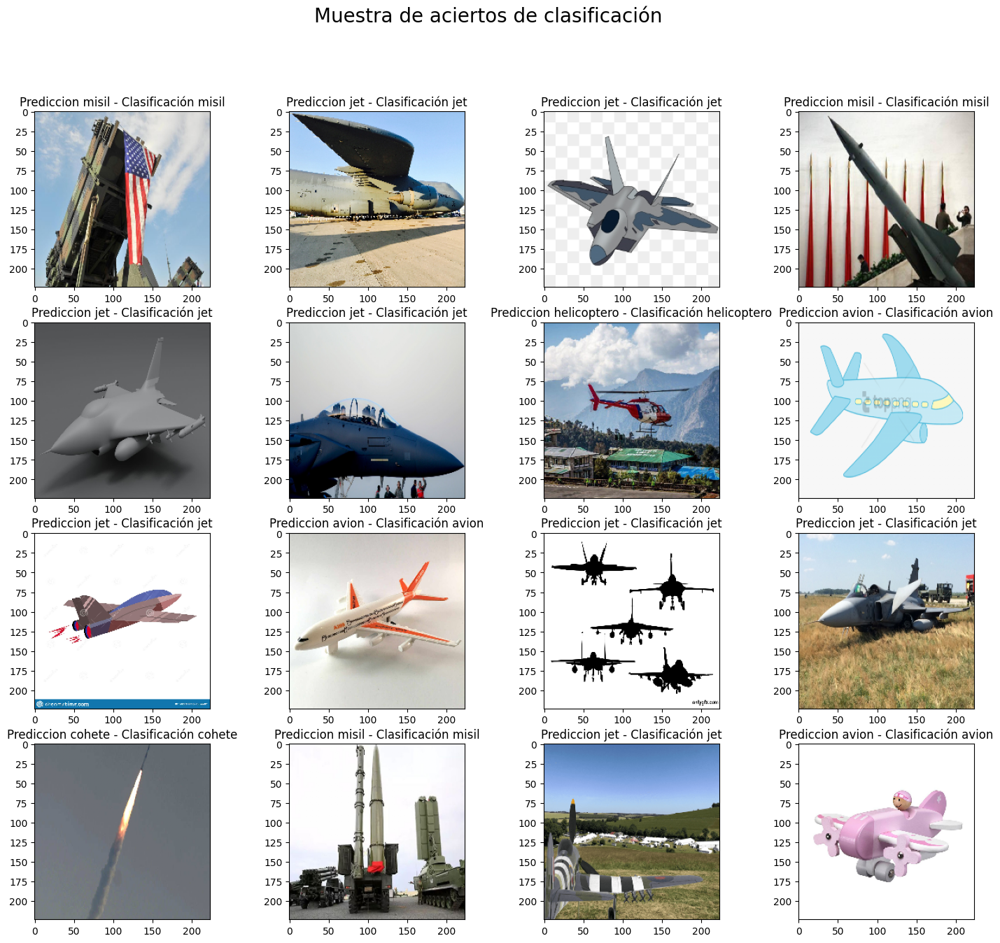

In [ ]:
#********************************* Gráfica de aciertos

print("\n")

fig,axs=plt.subplots(4,4,figsize=(18,15))

cont_im=0 #Contador para recorrer imagenes
for i in range(4):
    for j in range(4):
        idx_right=rights[cont_im]
        pred_class=lista_ids[label_predicted[idx_right]]
        real_class=lista_ids[etq_prueba[idx_right]]
        axs[i,j].imshow(img_prueba[idx_right]) #Gráfica de la imagen con error
        axs[i,j].set_title(f"Prediccion {pred_class} - Clasificación {real_class}")
        fig.suptitle("Muestra de aciertos de clasificación",fontsize=20)
        cont_im=cont_im+1